In [1]:
# ============================================================
#  Imports
# ============================================================

# --- Standard Libraries ---
import os
import sys
import math
import json
import textwrap
import importlib
from itertools import product as iproduct
from datetime import datetime
from string import Template
from pathlib import Path
from typing import Any, Dict, List, Tuple, Union, Optional
from pprint import pprint
import warnings

# --- Third-Party Libraries ---
from qulacs import QuantumCircuit, QuantumState, Observable, NoiseSimulator
from qulacs import state
import numpy as np
from qulacs import QuantumState, DensityMatrix, QuantumCircuit
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.patches as mpatches
from tabulate import tabulate
from IPython.display import display

# --- Local Modules ---
# Dynamically add `src/` to sys.path (go up two levels)
notebook_dir = Path.cwd()
sys.path.append(str(notebook_dir.parents[2] / "src"))

from hamiltonian import *

from nbutils.misc import load_simulation_tree
from nbutils.compile_plot import compile_zne_subplots
from nbutils.zne_plot import plot_zne_result
from nbutils.summarize import summarize_zne_results
from nbutils.export_raw_data_wrapped import export_raw_data_wrapped
from nbutils.master import *
from nbutils.tabletools import *

In [2]:
PATH = "data/8Q-t20-dephasing-target-heisenberg/VQE"

In [11]:
DATA_PATH = Path(
    PATH
)

final_states_dict = {}
target_observable_dict = {}
for json_file in sorted(DATA_PATH.glob("*.json")):
    with open(json_file, "r") as f:
        data = json.load(f)

    final_states_dict[json_file.stem] = data["others"]["final_states"][0]
    target_observable_dict[json_file.stem] = data["others"]["observable_string"]

print(final_states_dict.keys())

dict_keys(['8Q-t20-dephasing-target-heisenberg_run000_VQE', '8Q-t20-dephasing-target-heisenberg_run001_VQE', '8Q-t20-dephasing-target-heisenberg_run002_VQE', '8Q-t20-dephasing-target-heisenberg_run003_VQE', '8Q-t20-dephasing-target-heisenberg_run004_VQE', '8Q-t20-dephasing-target-heisenberg_run005_VQE', '8Q-t20-dephasing-target-heisenberg_run006_VQE', '8Q-t20-dephasing-target-heisenberg_run007_VQE', '8Q-t20-dephasing-target-heisenberg_run008_VQE', '8Q-t20-dephasing-target-heisenberg_run009_VQE'])


In [12]:
print(final_states_dict["8Q-t20-dephasing-target-heisenberg_run000_VQE"])

{
    "name": "DensityMatrix",
    "qubit_count": "8",
    "classical_register": "",
    "density_matrix": [
        {
            "real": "0.0001305619000465703",
            "imag": "2.6611326748116929e-18"
        },
        {
            "real": "-2.778227863016555e-05",
            "imag": "6.7487876185446857e-06"
        },
        {
            "real": "1.2364701278348421e-05",
            "imag": "1.268096587489496e-05"
        },
        {
            "real": "-8.2293076977266175e-06",
            "imag": "-6.7201955207143032e-06"
        },
        {
            "real": "-9.0985267592252362e-07",
            "imag": "6.8920665358678258e-06"
        },
        {
            "real": "-1.4208975121730699e-05",
            "imag": "-2.5958509097013396e-06"
        },
        {
            "real": "-0.00012642667902266444",
            "imag": "2.2609244966014458e-07"
        },
        {
            "real": "1.5079571561198756e-05",
            "imag": "7.8355355239441969e-06"
  

In [13]:
key = "8Q-t20-dephasing-target-heisenberg_run000_VQE"
VQE_OUT_STATE = state.from_json(final_states_dict[key])
target_observable_str = target_observable_dict[key]
N_QUBIT = VQE_OUT_STATE.get_qubit_count()
print(f"N_QUBIT = {N_QUBIT}")
print(target_observable_str)

N_QUBIT = 8
1 X 0 X 1 + 1 Y 0 Y 1 + 1 Z 0 Z 1 + 1 X 1 X 2 + 1 Y 1 Y 2 + 1 Z 1 Z 2 + 1 X 2 X 3 + 1 Y 2 Y 3 + 1 Z 2 Z 3 + 1 X 3 X 4 + 1 Y 3 Y 4 + 1 Z 3 Z 4 + 1 X 4 X 5 + 1 Y 4 Y 5 + 1 Z 4 Z 5 + 1 X 5 X 6 + 1 Y 5 Y 6 + 1 Z 5 Z 6 + 1 X 6 X 7 + 1 Y 6 Y 7 + 1 Z 6 Z 7


In [22]:
cn = [1 for _ in range (N_QUBIT)]
# TARGET_OBSERVABLE = create_observable_from_openfermion_text(target_observable_str)
TARGET_OBSERVABLE = create_heisenberg_hamiltonian(N_QUBIT, cn)
eigenvalues, _ = np.linalg.eigh(TARGET_OBSERVABLE.get_matrix().toarray())
exact_min_eigenvalue = np.min(eigenvalues)
print(f"Exact minimum eigenvalue: {exact_min_eigenvalue}")

Exact minimum eigenvalue: -13.49973039475157


In [23]:
energies = []

for item in final_states_dict.keys():
    single_vqe_out_state = state.from_json(final_states_dict[item])

    single_inf_shot_vqe_est = TARGET_OBSERVABLE.get_expectation_value(
        single_vqe_out_state
    )

    print(
        f"Expectation value with infinite shots for {item}: "
        f"{single_inf_shot_vqe_est}"
    )

    energies.append(single_inf_shot_vqe_est)

inf_shot_vqe_est_mean = np.mean(energies)
inf_shot_vqe_est_std = np.std(energies)

print(f"Mean of infinite shot expectation values: {inf_shot_vqe_est_mean}")
print(f"Standard deviation of infinite shot expectation values: {inf_shot_vqe_est_std}")

Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run000_VQE: -9.98624310354864
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run001_VQE: -9.497626686180205
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run002_VQE: -10.104078056871828
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run003_VQE: -9.970999655178169
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run004_VQE: -9.884663665196486
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run005_VQE: -9.691925200012562
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run006_VQE: -9.728380206898608
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run007_VQE: -9.713898448913515
Expectation value with infinite shots for 8Q-t20-dephasing-target-heisenberg_run008_VQE: -9.783689584106291
Expectation value with infin

In [17]:
def estimate_expectation_shots(
    observable_hami,
    state,
    n_shots: int,
):
    """
    Shot-based expectation value estimation with variance.
    Splits total n_shots equally between X and Z measurement bases.
    """
    n = state.get_qubit_count()
    n_terms = observable_hami.get_term_count()

    # ----------------------------------------------------------
    # Parse Hamiltonian
    # ----------------------------------------------------------
    xx_terms = []
    zz_terms = []
    x_terms = []
    z_terms = []
    constant_energy = 0.0

    for i in range(n_terms):
        term = observable_hami.get_term(i)
        coeff = term.get_coef().real
        pauli_ids = term.get_pauli_id_list()
        pauli_qubits = term.get_index_list()

        # Handle pure Identity terms (if any)
        if len(pauli_ids) == 0 or all(p == 0 for p in pauli_ids):
            constant_energy += coeff
            continue

        if len(pauli_ids) == 2 and all(p == 1 for p in pauli_ids):
            xx_terms.append((coeff, pauli_qubits[0], pauli_qubits[1]))
        elif len(pauli_ids) == 2 and all(p == 3 for p in pauli_ids):
            zz_terms.append((coeff, pauli_qubits[0], pauli_qubits[1]))
        elif len(pauli_ids) == 1 and pauli_ids[0] == 1:
            x_terms.append((coeff, pauli_qubits[0]))
        elif len(pauli_ids) == 1 and pauli_ids[0] == 3:
            z_terms.append((coeff, pauli_qubits[0]))
        else:
            print(f"[WARNING] Term {i} skipped (unsupported Pauli type)")

    # ----------------------------------------------------------
    # Allocate Shot Budget
    # ----------------------------------------------------------
    # Split shots between the two bases needed
    has_x = bool(xx_terms or x_terms)
    has_z = bool(zz_terms or z_terms)
    
    # Simple equal split strategy
    shots_x = n_shots // 2 if (has_x and has_z) else (n_shots if has_x else 0)
    shots_z = n_shots - shots_x if (has_x and has_z) else (n_shots if has_z else 0)

    # ----------------------------------------------------------
    # X-basis measurement group
    # ----------------------------------------------------------
    x_shot_energies = np.zeros(shots_x)
    if shots_x > 0:
        # Clone state and rotate to X basis (Hadamard)
        x_state = state.copy()
        from qulacs import QuantumCircuit
        rot = QuantumCircuit(n)
        for q in range(n):
            rot.add_H_gate(q)
        rot.update_quantum_state(x_state)

        # Sampling: Qulacs returns an array of integers
        samples = x_state.sampling(shots_x)
        for shot_idx, bitstring in enumerate(samples):
            # Bit extraction: bitstring LSB is qubit 0
            e_shot = 0.0
            
            # Optimization: only extract bits for qubits we actually care about,
            # or pre-unpack up to max needed index.
            bits = [(bitstring >> i) & 1 for i in range(n)]
            xvals = [1 - 2 * b for b in bits]

            for coeff, qi, qj in xx_terms:
                e_shot += coeff * xvals[qi] * xvals[qj]
            for coeff, qi in x_terms:
                e_shot += coeff * xvals[qi]

            x_shot_energies[shot_idx] = e_shot

    # ----------------------------------------------------------
    # Z-basis measurement group
    # ----------------------------------------------------------
    z_shot_energies = np.zeros(shots_z)
    if shots_z > 0:
        samples = state.sampling(shots_z)
        for shot_idx, bitstring in enumerate(samples):
            e_shot = 0.0
            bits = [(bitstring >> i) & 1 for i in range(n)]
            zvals = [1 - 2 * b for b in bits]

            for coeff, qi, qj in zz_terms:
                e_shot += coeff * zvals[qi] * zvals[qj]
            for coeff, qi in z_terms:
                e_shot += coeff * zvals[qi]

            z_shot_energies[shot_idx] = e_shot

    # ----------------------------------------------------------
    # Mean and Variance Calculations
    # ----------------------------------------------------------
    mean_x = x_shot_energies.mean() if shots_x > 0 else 0.0
    mean_z = z_shot_energies.mean() if shots_z > 0 else 0.0
    
    # Combined mean includes the static identity offset
    mean_energy = mean_x + mean_z + constant_energy

    var_energy = 0.0
    # Var(Sample Mean) = Var(Shot Energies) / N_shots
    if shots_x > 1:
        var_energy += np.var(x_shot_energies, ddof=1) / shots_x
    if shots_z > 1:
        var_energy += np.var(z_shot_energies, ddof=1) / shots_z

    stderr = np.sqrt(var_energy)

    return mean_energy, var_energy, stderr

In [18]:
def estimate_expectation_shots_heisenberg(
    observable_hami,
    psi,
    n_shots: int,
):
    """
    Shot-based expectation value for the Heisenberg Hamiltonian.

    Supports XX, YY, ZZ, X, Y, Z, and identity terms.
    Splits n_shots equally across the three required measurement bases.
    The input state `psi` is never modified.

    Y-basis rotation: S†H on every qubit maps |±y⟩ → |0/1⟩.

    Returns
    -------
    mean_energy : float
    var_energy  : float   (variance of the sample mean estimator)
    stderr      : float
    """
    from qulacs import QuantumCircuit
    import numpy as np

    n      = psi.get_qubit_count()
    n_terms = observable_hami.get_term_count()

    # ----------------------------------------------------------
    # Parse Hamiltonian into basis groups
    # ----------------------------------------------------------
    xx_terms = []
    yy_terms = []
    zz_terms = []
    x_terms  = []
    y_terms  = []
    z_terms  = []
    constant_energy = 0.0

    for i in range(n_terms):
        term       = observable_hami.get_term(i)
        coeff      = term.get_coef().real
        pauli_ids  = term.get_pauli_id_list()   # 0=I 1=X 2=Y 3=Z
        pauli_qubs = term.get_index_list()

        if len(pauli_ids) == 0 or all(p == 0 for p in pauli_ids):
            constant_energy += coeff
            continue

        if len(pauli_ids) == 2:
            if all(p == 1 for p in pauli_ids):
                xx_terms.append((coeff, pauli_qubs[0], pauli_qubs[1]))
            elif all(p == 2 for p in pauli_ids):
                yy_terms.append((coeff, pauli_qubs[0], pauli_qubs[1]))
            elif all(p == 3 for p in pauli_ids):
                zz_terms.append((coeff, pauli_qubs[0], pauli_qubs[1]))
            else:
                print(f"[WARNING] Term {i} skipped (mixed two-qubit Pauli)")
            continue

        if len(pauli_ids) == 1:
            if pauli_ids[0] == 1:
                x_terms.append((coeff, pauli_qubs[0]))
            elif pauli_ids[0] == 2:
                y_terms.append((coeff, pauli_qubs[0]))
            elif pauli_ids[0] == 3:
                z_terms.append((coeff, pauli_qubs[0]))
            continue

        print(f"[WARNING] Term {i} skipped (unsupported structure)")

    # ----------------------------------------------------------
    # Allocate shot budget
    # ----------------------------------------------------------
    has_x   = bool(xx_terms or x_terms)
    has_y   = bool(yy_terms or y_terms)
    has_z   = bool(zz_terms or z_terms)
    n_bases = sum([has_x, has_y, has_z]) or 1

    base_shots = n_shots // n_bases
    remainder  = n_shots % n_bases

    shots_x = base_shots + (1 if has_x and remainder > 0 else 0) if has_x else 0
    if has_x and remainder > 0:
        remainder -= 1
    shots_y = base_shots + (1 if has_y and remainder > 0 else 0) if has_y else 0
    if has_y and remainder > 0:
        remainder -= 1
    shots_z = base_shots if has_z else 0

    # ----------------------------------------------------------
    # Helper
    # ----------------------------------------------------------
    def to_vals(bitstring):
        return [1 - 2 * ((bitstring >> i) & 1) for i in range(n)]

    # ----------------------------------------------------------
    # X-basis  (H on every qubit)
    # ----------------------------------------------------------
    x_shot_energies = np.zeros(shots_x)
    if shots_x > 0:
        x_state = psi.copy()
        rot = QuantumCircuit(n)
        for q in range(n):
            rot.add_H_gate(q)
        rot.update_quantum_state(x_state)

        for idx, bs in enumerate(x_state.sampling(shots_x)):
            vals = to_vals(bs)
            e    = sum(c * vals[qi] * vals[qj] for c, qi, qj in xx_terms)
            e   += sum(c * vals[qi]             for c, qi    in x_terms)
            x_shot_energies[idx] = e

    # ----------------------------------------------------------
    # Y-basis  (S†H on every qubit)
    # S† then H: maps |+y⟩→|0⟩, |−y⟩→|1⟩
    # ----------------------------------------------------------
    y_shot_energies = np.zeros(shots_y)
    if shots_y > 0:
        y_state = psi.copy()
        rot = QuantumCircuit(n)
        for q in range(n):
            rot.add_Sdag_gate(q)
            rot.add_H_gate(q)
        rot.update_quantum_state(y_state)

        for idx, bs in enumerate(y_state.sampling(shots_y)):
            vals = to_vals(bs)
            e    = sum(c * vals[qi] * vals[qj] for c, qi, qj in yy_terms)
            e   += sum(c * vals[qi]             for c, qi    in y_terms)
            y_shot_energies[idx] = e

    # ----------------------------------------------------------
    # Z-basis  (no rotation)
    # ----------------------------------------------------------
    z_shot_energies = np.zeros(shots_z)
    if shots_z > 0:
        for idx, bs in enumerate(psi.sampling(shots_z)):   # psi, not state
            vals = to_vals(bs)
            e    = sum(c * vals[qi] * vals[qj] for c, qi, qj in zz_terms)
            e   += sum(c * vals[qi]             for c, qi    in z_terms)
            z_shot_energies[idx] = e

    # ----------------------------------------------------------
    # Mean and variance of the sample-mean estimator
    # Var(X̄ + Ȳ + Z̄) = Var(X̄) + Var(Ȳ) + Var(Z̄)  (independent)
    # ----------------------------------------------------------
    mean_x = x_shot_energies.mean() if shots_x > 0 else 0.0
    mean_y = y_shot_energies.mean() if shots_y > 0 else 0.0
    mean_z = z_shot_energies.mean() if shots_z > 0 else 0.0
    mean_energy = mean_x + mean_y + mean_z + constant_energy

    var_energy = 0.0
    if shots_x > 1:
        var_energy += np.var(x_shot_energies, ddof=1) / shots_x
    if shots_y > 1:
        var_energy += np.var(y_shot_energies, ddof=1) / shots_y
    if shots_z > 1:
        var_energy += np.var(z_shot_energies, ddof=1) / shots_z

    stderr = np.sqrt(var_energy)
    return mean_energy, var_energy, stderr

In [19]:
energy, variance, stderr =estimate_expectation_shots_heisenberg(
    TARGET_OBSERVABLE,
    VQE_OUT_STATE,
    n_shots=5000,
)

print(f"E      = {energy}")
print(f"Var(E) = {variance}")
print(f"SE     = {stderr}")

E      = 1.0
Var(E) = 0.0
SE     = 0.0


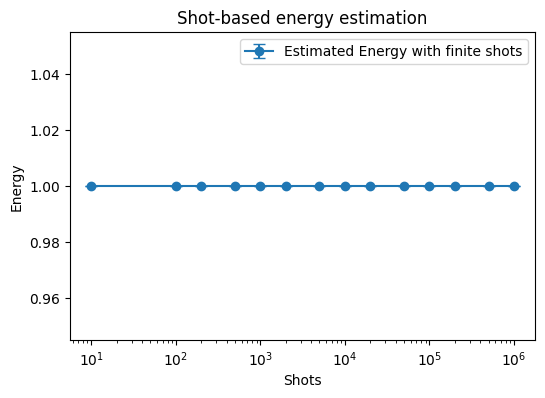

In [ ]:
shot_list = [10, 100, 200, 500, 1000, 2000, 5000, 10000, 20000, 50000, 100000, 200000, 500000, 1000000]

energies = []
variances = []
stderrs = []

for shots in shot_list:

    energy, variance, stderr = estimate_expectation_shots(
        TARGET_OBSERVABLE,
        VQE_OUT_STATE,
        n_shots=shots,
    )

    energies.append(energy)
    variances.append(variance)
    stderrs.append(stderr)

# Plot energy with error bars
plt.figure(figsize=(6,4))
plt.errorbar(
    shot_list,
    energies,
    yerr=stderrs,
    marker="o",
    capsize=4,
    label="Estimated Energy with finite shots"
)
# plt.axhline(
#     inf_shot_vqe_est_mean,
#     color="r",
#     linestyle="-",
#     label="Infinite-shot estimates over 10 trials"
# )
# plt.axhspan(
#     inf_shot_vqe_est_mean - inf_shot_vqe_est_std,
#     inf_shot_vqe_est_mean + inf_shot_vqe_est_std,
#     alpha=0.2,
#     color="r",
# )
#plt.axhline(y=exact_min_eigenvalue, color="g", linestyle="--", label="Exact minimum eigenvalue")
plt.xscale("log")
plt.xlabel("Shots")
plt.ylabel("Energy")
plt.title("Shot-based energy estimation")
#plt.grid(True)
plt.legend()
plt.show()

---

In [ ]:
from quri_parts.core.operator import Operator, pauli_label, PAULI_IDENTITY
from quri_parts.core.state import quantum_state

# op = Operator({
#     pauli_label("Z0"): 0.25,
#     pauli_label("Z1 Z2"): 2.0,
#     pauli_label("X1 X2"): 0.5 + 0.25j,
#     pauli_label("Z1 Y3"): 1.0j,
#     pauli_label("Z2 Y3"): 1.5 + 0.5j,
#     pauli_label("X1 Y3"): 2.0j,
#     PAULI_IDENTITY: 3.0,
# })

op = Operator({
    pauli_label("X0 X1"): 1.0,
    pauli_label("Y0 Y1"): 1.0,
    pauli_label("Z0 Z1"): 1.0,
    pauli_label("X1 X2"): 1.0,
    pauli_label("Y1 Y2"): 1.0,
    pauli_label("Z1 Z2"): 1.0,
    pauli_label("X2 X3"): 1.0,
    pauli_label("Y2 Y3"): 1.0,
    pauli_label("Z2 Z3"): 1.0,
    pauli_label("X3 X4"): 1.0,
    pauli_label("Y3 Y4"): 1.0,
    pauli_label("Z3 Z4"): 1.0,
    pauli_label("X4 X5"): 1.0,
    pauli_label("Y4 Y5"): 1.0,
    pauli_label("Z4 Z5"): 1.0,
    pauli_label("X5 X6"): 1.0,
    pauli_label("Y5 Y6"): 1.0,
    pauli_label("Z5 Z6"): 1.0,
    pauli_label("X6 X7"): 1.0,
    pauli_label("Y6 Y7"): 1.0,
    pauli_label("Z6 Z7"): 1.0,
})

print("Operator:")
print(op)


# Create a QuantumState instance
state = QuantumState(N_QUBIT)

# Initialize the state to a Haar random state
state.set_Haar_random_state()

#state = VQE_OUT_STATE
print("")
print("State:")
print(state)

Operator:
1.0*X0 X1 + 1.0*Y0 Y1 + 1.0*Z0 Z1 + 1.0*X1 X2 + 1.0*Y1 Y2 + 1.0*Z1 Z2 + 1.0*X2 X3 + 1.0*Y2 Y3 + 1.0*Z2 Z3 + 1.0*X3 X4 + 1.0*Y3 Y4 + 1.0*Z3 Z4 + 1.0*X4 X5 + 1.0*Y4 Y5 + 1.0*Z4 Z5 + 1.0*X5 X6 + 1.0*Y5 Y6 + 1.0*Z5 Z6 + 1.0*X6 X7 + 1.0*Y6 Y7 + 1.0*Z6 Z7

State:
 *** Quantum State ***
 * Qubit Count : 8
 * Dimension   : 256
 * State vector : 
   (0.0617436,-0.048421)
   (0.0169164,0.0111363)
  (-0.0192362,0.0152693)
   (0.0718134,-0.028292)
 (-0.0144635,-0.0496007)
  (0.0540642,-0.0689671)
  (0.0371689,-0.0191874)
 (-0.0700016,-0.0766928)
  (0.0501424,-0.0917693)
  (-0.0412305,0.0836624)
  (0.0175743,-0.0676146)
    (0.0193384,0.023497)
 (-0.0507612,-0.0109753)
  (0.0087129,0.00742596)
  (0.0269043,-0.0133746)
 (0.000980127,0.0655969)
   (0.0467438,0.0826707)
(-0.00527024,-0.0532449)
   (-0.0539889,0.013046)
   (0.0264858,0.0211978)
 (-0.0262373,-0.0268588)
 (-0.00125482,0.0159095)
  (-0.040376,0.00731139)
  (0.0625892,-0.0719245)
 (0.0737837,-0.00403373)
  (0.0347601,-0.0126123)
